In [1]:
# define the path of the data and project
data_path = 'D:/VScode/MRes/scienceweb.whoi.edu/itp/data/'

In [2]:
# read the cleaned xarray from local file
import xarray as xr
ds_cleaned_750=xr.open_dataset(f"{data_path}/ds_cleaned_750.nc")
# convert the profile data to string
ds_cleaned_750['profiler']=ds_cleaned_750['profiler'].astype(str)

In [14]:
# read the cleaned xarray from local file
import xarray as xr
ds_cleaned_250=xr.open_dataset(f"{data_path}/ds_cleaned_250.nc")
# convert the profile data to string
ds_cleaned_250['profiler']=ds_cleaned_250['profiler'].astype(str)
# exclude the data with lat<60
ds_cleaned_250=ds_cleaned_250.where(ds_cleaned_250['lat']>60,drop=True)

In [3]:
ds_cleaned_750

<xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

In [5]:
# group the data by year
ds_grouped=ds_cleaned_750.groupby('date.year')
ds_grouped

DatasetGroupBy, grouped over 'year'
19 groups with labels 2004, 2005, 2006, ..., 2021, 2022.

In [12]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

def plot_dist_by_year(ds):
    ds_grouped = ds.groupby('date.year')

    # Calculate the number of rows and columns for the subplots
    num_years = len(ds_grouped)
    num_cols = 4
    num_rows = (num_years + num_cols - 1) // num_cols

    # Create a figure and axes for the subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(4*num_cols, 4*num_rows), dpi=300)

    # Flatten the axes array for ease of iteration
    axes = axes.flatten()

    # Loop through the group and plot the data distribution
    for i, (year, ds) in enumerate(ds_grouped):
        # Select the current subplot
        ax = axes[i]

        # Create a polar stereographic basemap
        map = Basemap(projection='npstere', boundinglat=60, lon_0=0, resolution='l', ax=ax)

        # Set the map coordinates to match the data extent
        map.drawmapboundary(fill_color='white')
        map.fillcontinents(color='gray', lake_color='white')

        lon_vals = ds.lon.values
        lat_vals = ds.lat.values

        # Convert lon/lat to map projection coordinates
        x, y = map(lon_vals, lat_vals)

        # Plot the boundary on the map
        map.scatter(x, y, label=f'{year}')

        # Add title for the subplot
        ax.set_title(f'Year {year}')

    # Add labels and legend to the last subplot
    axes[-1].set_xlabel('Longitude')
    axes[-1].set_ylabel('Latitude')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Delete the unused subplots
    for i in range(num_years, num_cols * num_rows):
        fig.delaxes(axes[i])

    # Show the plot
    plt.show()


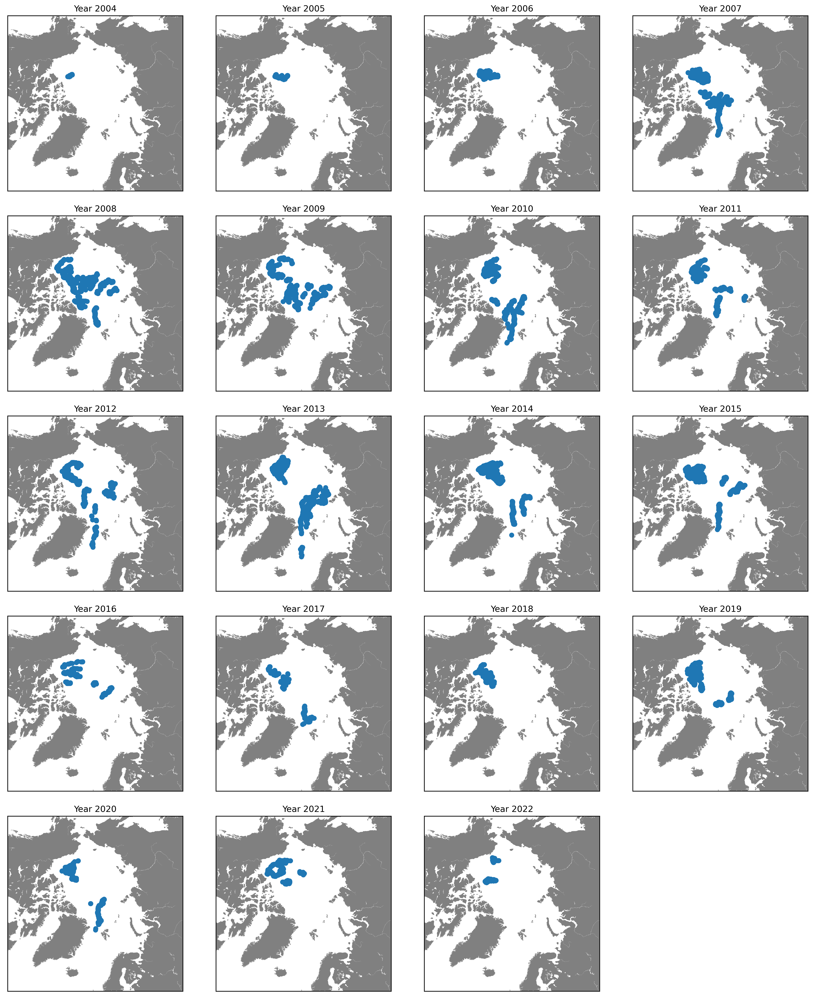

In [13]:
plot_dist_by_year(ds_cleaned_750)

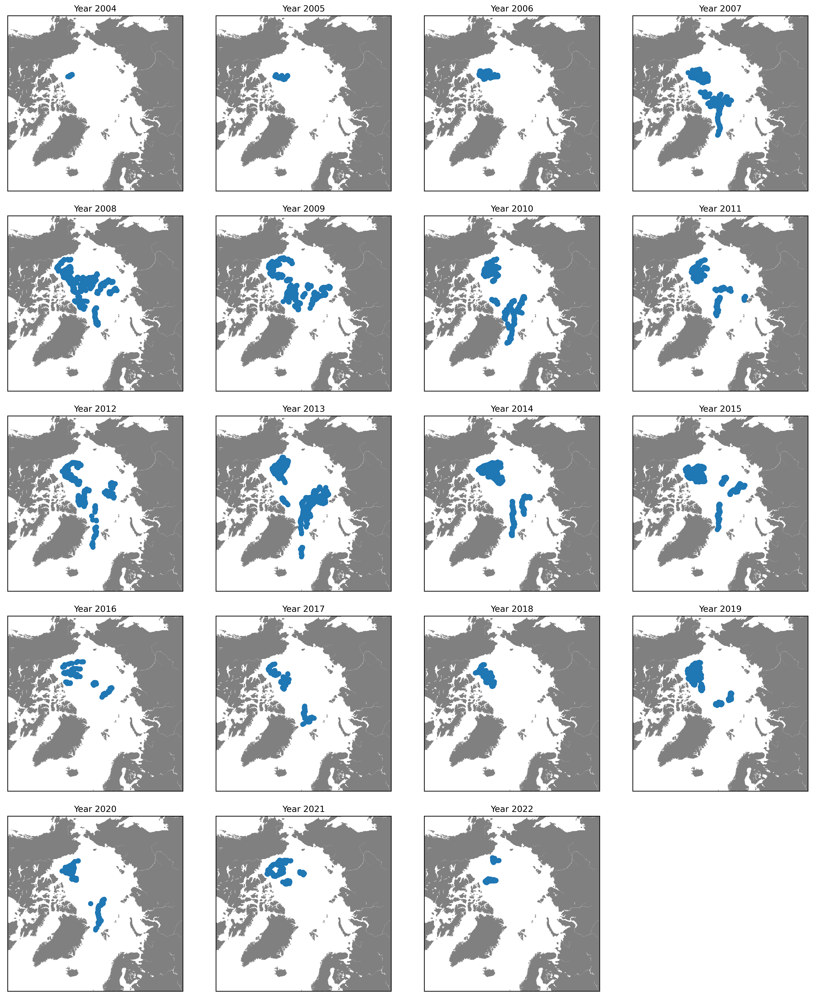

In [15]:
plot_dist_by_year(ds_cleaned_250)

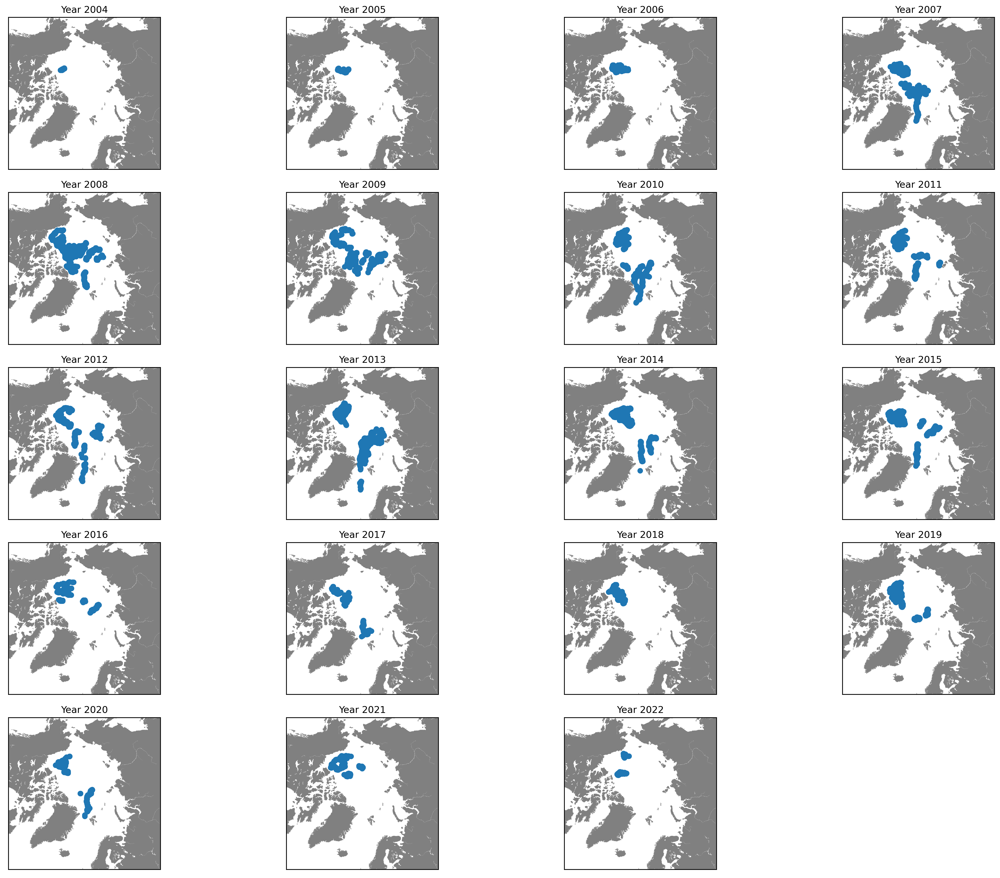

In [11]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

ds_grouped = ds_cleaned_750.groupby('date.year')

# Calculate the number of rows and columns for the subplots
num_years = len(ds_grouped)
num_cols = 4
num_rows = (num_years + num_cols - 1) // num_cols

# Create a figure and axes for the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(4*num_rows, 4*num_cols),dpi=300)

# Flatten the axes array for ease of iteration
axes = axes.flatten()

# Loop through the group and plot the data distribution
for i, (year, ds) in enumerate(ds_grouped):
    # Select the current subplot
    ax = axes[i]

    # Create a polar stereographic basemap
    map = Basemap(projection='npstere', boundinglat=60, lon_0=0, resolution='l', ax=ax)

    # Set the map coordinates to match the data extent
    map.drawmapboundary(fill_color='white')
    map.fillcontinents(color='gray', lake_color='white')

    lon_vals = ds.lon.values
    lat_vals = ds.lat.values

    # Convert lon/lat to map projection coordinates
    x, y = map(lon_vals, lat_vals)

    # Plot the boundary on the map
    map.scatter(x, y, label=f'{year}')

    # Add title for the subplot
    ax.set_title(f'Year {year}')

# Add labels and legend to the last subplot
axes[-1].set_xlabel('Longitude')
axes[-1].set_ylabel('Latitude')
# axes[-1].legend()

# Adjust spacing between subplots
plt.tight_layout()

# delete the unused subplots
for i in range(num_years, num_cols * num_rows):
    fig.delaxes(axes[i])


# Show the plot
plt.show()
